In [1]:
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
import vega_datasets

from altair import Scale
from vega_datasets import data
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

alt.renderers.enable('notebook')
alt.data_transformers.disable_max_rows()

# Load TopoJSON file of Wales
wlad = alt.topo_feature('https://martinjc.github.io/UK-GeoJSON/json/wal/topo_lad.json','lad')
df = pd.read_csv('wales_road_accident_2018.csv')

# Pre-processing 

In [2]:
# Function to Shrink lat/long coordinates towards centre by some scalar offsets
def shrink(df, left, right, up, down):  

    #Partition plot coordinates across y and x axes
    y_line = (df.Longitude.min() + df.Longitude.max())/2 
    x_line = (df.Latitude.min() + df.Latitude.max())/2

    # Creat two plottable, modified lat long Series
    Plot_Longitude = pd.concat([pd.Series((df.loc[df.Longitude <= y_line]).Longitude+right),
                                    (pd.Series((df.loc[df.Longitude > y_line]).Longitude-left))])

    Plot_Latitude = pd.concat([pd.Series((df.loc[df.Latitude > x_line]).Latitude-down),
                                   pd.Series((df.loc[df.Latitude <= x_line]).Latitude+up)])

    # Insert modified lat/long series into dataframe for plotting
    df.insert(df.shape[-1],'Plot_Latitude', Plot_Latitude)
    df.insert(df.shape[-1], 'Plot_Longitude', Plot_Longitude)

    return df

In [3]:
drop_list = ['Accident_Index', 'Location_Easting_OSGR', 'Location_Northing_OSGR',
             'Local_Authority_(District)','Local_Authority_(Highway)', 'LSOA_of_Accident_Location',
            'Date','Time',]

# Drop the list out of the dataset
df.dropna(axis = 0, inplace=True) # clear the original data of NA values
analytic_data = df.drop(drop_list,axis=1) # Take out features that cannot contribute to LDA - PCA


# Perform PCA and project to pca_data
pca = PCA(n_components = 2)
pca.fit(analytic_data)
pca_data = pca.transform(analytic_data)

# Perform LDA and project to lda_data
lda = LinearDiscriminantAnalysis(n_components=2, solver='svd')
lda.fit(analytic_data, analytic_data['Weather_Conditions'])
lda_data = lda.transform(analytic_data)

# Put the new data back to dataset to be visualiable by Altair
df['PC1'] = pca_data[:,0]
df['PC2'] = pca_data[:,1]
df['LD1'] = lda_data[:,0]
df['LD2'] = lda_data[:,1]

c:\users\benll\python\python37\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [4]:
df.Accident_Severity.replace([1, 2, 3],
                             ['Fatal', 'Serious', 'Slight'],
                             inplace=True)

df.Road_Type.replace([1,2,3,6,7,9,12],
                     ['Roundabout','One way street','Dual carriageway',
                      'Single carriageway','Slip road','Unknown','One way street/Slip road'],
                     inplace=True)

df.Road_Surface_Conditions.replace([1,2,3,4,5,6,7],
                                   ['Dry','Wet','Snow', 'Ice', 'Flood', 'Oil', 'Mud'],
                                   inplace=True)

df.Weather_Conditions.replace([1,2,3,4,5,6,7,8,9],
                              ['Fine','Raining','Snowing',
                               'Fine + winds', 'Raining + winds', 'Snowing + winds',
                               'Fog', 'Other', 'Unknown'],
                              inplace=True)

df.Day_of_Week.replace([1,2,3,4,5,6,7,],
                       ['Sunday', 'Monday','Tuesday','Wednesday',
                       'Thursday', 'Friday', 'Saturday'],
                       inplace=True)

In [5]:
# brush selection just for test
brush_1 = alt.selection_interval()
brush_timetable = alt.selection_interval()

# Interactive selection by Accident Severity
severity_selection = alt.selection_multi(fields= ['Accident_Severity'])

env_selector = alt.selection_multi(fields = ['Road_Surface_Conditions', 'Weather_Conditions'])

# Define colour scheme from Vega
scheme = 'viridis'

# Custome scale to interact with charts by accident severity
s_scale = alt.Scale(domain=['Fatal','Serious','Slight'], scheme=scheme)

# Alias for colour format to ensure all relayted charts share the same scale
c_color = alt.condition(severity_selection,
                       alt.Color('Accident_Severity:O', scale=s_scale, legend=None),
                       alt.value('lightgrey'))

In [6]:
# left chart pca
pc_chart = alt.Chart(df).mark_point().encode(
    x = 'PC1:Q',
    y = 'PC2:Q',
    color = alt.condition(brush_1,
                          'Weather_Conditions:N',
                          alt.value('lightgray'))
).properties(width = 300,
             height = 300,
             title = "PCA ~ Not actually good info"
).add_selection(brush_1)


# Legend for selecting instances by accident severity
m_legend = alt.Chart(df).mark_bar().encode(
    x = alt.X('Accident_Severity:O',
              title = None),
    color = alt.condition(severity_selection,
                          'Accident_Severity:O',
                          alt.value('lightgray'),
                          legend = None,
                          scale = alt.Scale(scheme = 'viridis')),
    tooltip='count(Number_of_Casualties)'
).properties(width = 100,
             height = 20,
             title = 'Severity Selector'
).add_selection(severity_selection)


In [7]:
# right chart LDA
ld_chart = alt.Chart(df).mark_circle().encode(
    x = 'LD1:Q',
    y = 'LD2:Q',
    color = c_color
).properties(width = 300,
             height = 300,
            title = 'Discriminant Analysis based on Weather Conditions'
).add_selection(brush_1
).transform_filter(severity_selection
).transform_filter(env_selector
)


# Time Series Evaluation

In [8]:
import datetime
df = df.reset_index() # due to the drops we need to re-initialize the index for those data
my_new_dates = []

for i in range(len(df)):
    tempo = df['Date'][i]+ ' ' +df['Time'][i]
    my_new_dates.append(tempo)

# Make the dates array 
my_new_dates = np.array(my_new_dates)

# Transform the strings to date time objects
for i in range(len(my_new_dates)):
    my_time = str(my_new_dates[i]) # take it as string
    my_time = datetime.datetime.strptime(my_time, '%d/%m/%Y %H:%M') # make it date
    my_new_dates[i] = my_time # replace it in the list

# put the whole list back to the dataframe
df['new_date'] = my_new_dates

In [9]:
conditions = alt.Chart(df).mark_bar().encode(
    alt.X('Road_Surface_Conditions:N',
         title='Road Conditions',
         axis = alt.Axis(grid=True)
         ),
    alt.Y('Weather_Conditions:N',
         title = 'Weather',
         axis = alt.Axis(grid=True)
         ),
    color = alt.condition(env_selector,
                          'Accident_Severity:O',
                          alt.value('lightgray'),
                          legend = None,
                          scale = alt.Scale(scheme = scheme)),
    tooltip = ['count(Number_of_Casualties)']
).add_selection(env_selector
).transform_filter(severity_selection
).transform_filter(brush_timetable
).transform_filter(brush_1
).properties(width=300, height = 300)


road = alt.Chart(df).mark_bar().encode(
    alt.Y('Road_Type:N', title = None),
    alt.X('count(Number_of_Casualties):O',
        #stack='center',
         title='No. of Casualties'),
    color = c_color,
    tooltip = ['count(Number_of_Casualties)']
).transform_filter(brush_timetable
).transform_filter(brush_1
).transform_filter(severity_selection
).transform_filter(env_selector
).properties(width=300, height=300)

# Chart Config

In [10]:
# Heatmap representation of accident counts by date
timetable = alt.Chart(df).mark_rect().encode(
    alt.X('hours(new_date):O',
              title = 'Hour of the day'),
    alt.Y('month(new_date):O',
              title = 'Month'),
    color = alt.condition(brush_timetable,
                          'count():Q',
                          alt.value('lightgray'),
                          scale = alt.Scale(scheme = 'orangered'),
                          legend = alt.Legend(orient = 'bottom'),
                          title = 'Number of Accidents'),
    tooltip = 'count(Number_of_Casualties):Q'
).properties(width = 350,
             height = 250, 
             title = 'Timetable of Accidents ~ Wales 2018'
).add_selection(brush_timetable)

# Merge views responsible for selection to ensure they are all initialised together (JavaScript Errors)
selectors = (m_legend & conditions)

# Chart to represent number and severity of casualties for a selected time period
week = alt.Chart(df).mark_bar().encode(
    alt.X('Day_of_Week:O',
          title = 'Week Day'),
    alt.Y('count(Number_of_Casualties):Q',
          stack = 'center',
         title = 'Casualties'),
    color = c_color,
    tooltip = ['count(Number_of_Casualties)']
).properties(width = 350,
             height = 250
).transform_filter(brush_timetable
).transform_filter(brush_1
).transform_filter(severity_selection
).transform_filter(env_selector)

In [11]:
# Shrink coordinates towards center to reduce spread over map
shrink(df, 0.05, 0.25, -0.15, 0.08)


,index,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,PC1,PC2,LD1,LD2,new_date,Plot_Latitude,Plot_Longitude
0,0,201860W000254,306115.0,380846.0,-3.410743,53.316208,60,Serious,1,2,...,1,1,W01000217,-961.847034,-267.966111,-0.934919,-0.309573,2018-01-04 15:42,53.236208,-3.460743
1,1,201860W000373,327543.0,352141.0,-3.082646,53.061598,60,Slight,2,1,...,2,2,W01000398,3944.559424,-52.363843,1.797010,2.399051,2018-01-04 20:40,52.981598,-3.132646
2,2,201860W000475,331756.0,371287.0,-3.023876,53.234228,60,Slight,2,1,...,2,1,W01000333,-1507.756097,-233.417508,1.625453,-0.173810,2018-01-05 06:20,53.154228,-3.073876
3,3,201860W000572,332569.0,356963.0,-3.008675,53.105595,60,Slight,2,2,...,2,1,W01000390,3854.515773,-572.730385,-0.702927,-0.922978,2018-01-05 12:39,53.025595,-3.058675
4,4,201860W000652,259792.0,318968.0,-4.078747,52.750104,60,Serious,3,1,...,2,1,W01000048,-1012.752093,-264.753425,1.286120,-0.057157,2018-01-05 15:20,52.670104,-3.828747
5,5,201860W000753,292868.0,371906.0,-3.606496,53.233363,60,Slight,1,1,...,2,1,W01000122,-960.856027,-268.044896,1.733229,0.129022,2018-01-05 18:57,53.153363,-3.656496
6,6,201860W000955,300869.0,381269.0,-3.489594,53.319052,60,Slight,2,2,...,1,1,W01000240,-1507.755843,-233.417485,1.421086,-0.735104,2018-01-06 07:20,53.239052,-3.539594
7,7,201860W001058,247046.0,353228.0,-4.283567,53.054377,60,Slight,1,1,...,2,2,W01000104,-1507.756135,-233.419043,-0.888736,2.646896,2018-01-06 11:39,52.974377,-4.033567
8,8,201860W001708,284197.0,380252.0,-3.739382,53.306527,60,Serious,1,1,...,1,1,W01000155,-1507.756073,-233.417110,-0.894496,0.098534,2018-01-07 22:19,53.226527,-3.789382
9,9,201860W002614,305263.0,382295.0,-3.423961,53.329077,60,Slight,2,4,...,1,1,W01000222,-1507.755642,-233.417132,1.205854,-1.295176,2018-01-10 08:35,53.249077,-3.473961


In [12]:
# Read in GeoJSON of map
background = alt.Chart(wlad).encode(
    color=alt.value('#FFFFFF')
)

# Plot accident instances by lat/long coordinates
points = alt.Chart(df).encode(
    alt.Y('Plot_Latitude:Q',
          scale = alt.Scale(domain=(df['Latitude'].min(),
                                    df['Latitude'].max())),
          axis = alt.Axis(labels=False, tickCount=0),
          title = None
         ),
    alt.X('Plot_Longitude:Q',
          scale = alt.Scale(domain=(df['Longitude'].min(),
                                    df['Longitude'].max())),
          axis= alt.Axis(labels=False, tickCount=0),
          title=None
         ),
    tooltip=('Accident_Index'),
    color = c_color
).properties(
    width=400,
    height=400
).add_selection(brush_1
).transform_filter(brush_timetable
).transform_filter(brush_1
).transform_filter(severity_selection
).transform_filter(env_selector)


# Layer points over map
layer_map = (background.mark_geoshape(
    stroke = 'grey',
    strokeWidth=1
    ) + points.mark_point(size=0.9))

# Plot

### <p> Hold Shift for multiple selection of cells in selector views. (Severity Selector and weather grid) </p> 
### <p> Click white space within interacted chart to restore previous filter state</p>
### <p> Map and heatmap have interactive highlight brush </p>
## Have fun!

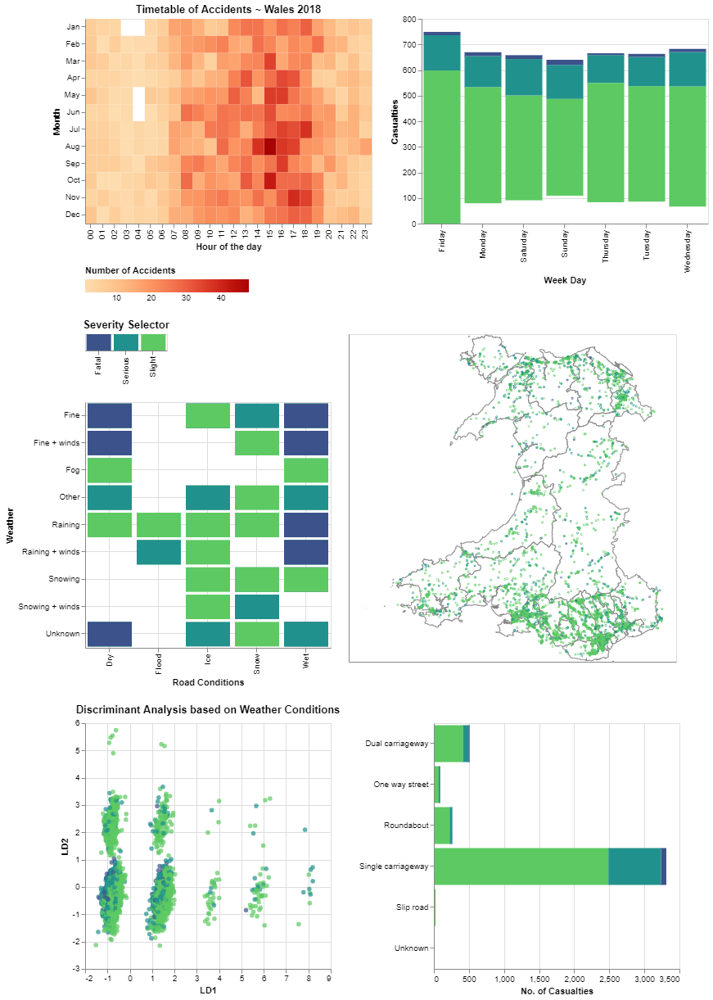

In [13]:
((timetable | week).resolve_scale(color='independent') & (selectors | layer_map ).resolve_scale(
    color='independent') & (ld_chart | road).resolve_scale(color='independent'))